In [12]:
import os

import matplotlib as mpl
mpl.rcParams['font.family'] = 'monospace'
import matplotlib.pyplot as plt
import numpy as np
import datetime
import scipy
import utils
from matplotlib import cm
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal
from scipy.fft import fft, fftfreq, fftshift, ifft
import matplotlib.colors as colors

In [13]:
notes = utils.cr
crom = list(notes.values())

song = "songs/besalu_beg.wav"

x_min = notes["F#2"]
#x_min = notes["C1"]
#x_max = (notes["A5"]+notes['A#5'])/2
x_max = (notes["F5"]+notes['F#5'])/2
#x_max = notes['E5']
#x_max = notes['C6']


delta = 0.20

In [14]:


sf, y = scipy.io.wavfile.read(song)
y = y[:, 0]
dt = 1 / sf
N = int(delta / dt)
bins = int(len(y) // N)
y = y[:N*bins]
arr = np.reshape(y[: N * bins], (bins, N))

x_f = scipy.fft.fftfreq(N, dt)[: N // 2]

x_ff = x_f[(x_f>x_min) & (x_f<x_max)]
idx_i = list(x_f).index(x_ff[0])
idx_f = list(x_f).index(x_ff[-1])
x_f = x_ff

def power_spectrum(y):
    f = (2.0 / (N // 2)) * np.abs(scipy.fft.fft(y)[: N // 2])[idx_i:idx_f+1]
    return f

k = 200

xx = []
xx.append(list(np.linspace(0, 1, k)))
for i in range(10 + 1):
    x = list(np.linspace(2**i, 2 ** (i + 1), k))
    xx.append(x)

xx = utils.flatten(xx)
xx = np.array(xx)

def interpolate(f):
    result = np.interp(xx, x_f, f)

    return result


win = k//10

def moving_average(a, n=win):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1 :] / n

def moving_average(a, n=win):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1 :] / n


f = np.apply_along_axis(power_spectrum, 1, arr)
f = np.apply_along_axis(interpolate, 1, f)
f = np.apply_along_axis(moving_average, 1, f)

f_max = np.apply_along_axis(np.max, 1, f)
top = np.percentile(f_max,80)

def topa(y):
    
    if y.max() > top:
        
        y_f = top*y/y.max()
        
        return y_f
    else:
        return y  


#f_plot = np.apply_along_axis(topa, 1, f_plot)    

    
x_f = xx[win // 2 - 1 : -win // 2]

def sigmoid1(y):

    sigm =  1 + 2 / (1 + np.exp(0.01*(500-x_f)))
    
    return y*sigm

f = np.apply_along_axis(sigmoid1, 1, f)   
f = np.apply_along_axis(topa, 1, f)    

scale = 1.4

f = f*scale

print(np.shape(f))

(505, 2381)


In [16]:
fig_size = 50
ratio = 25/45

# x_min = notes["F#2"]
# #x_min = notes["C1"]
# x_max = (notes["A5"]+notes['A#5'])/2
# x_max = (notes["B5"]+notes['C5'])/2
#x_max = notes['B5']

fig, ax = plt.subplots(figsize=(np.sqrt(ratio*fig_size),
                          np.sqrt(fig_size/ratio)), dpi=1200)
fig.patch.set_facecolor('k')

key = ['G#2','A2', 'B2', 'C#3', 'D#3', 'E3', 'F#3', 'G#3', 'A3', 'B3', 'C#4', 'D#4',
       'E4', 'F#4', 'G#4', 'A4', 'B4', 'C#5', 'D#5', 'E5', 'F#5', 'G#5']
new_notes = {k:notes[k] for k in key if k in notes}

cmap = mpl.colors.LinearSegmentedColormap.from_list("", [(0, 0, 1), (1, 0, 0)])

tope = bins
tope = 360
tope = 505
tope = bins
#tope = 5

step = 4
step = 3

f_plot = f[::step,:]



#f_plot = np.apply_along_axis(sigmoid1, 1, f_plot)    

#f_plot = np.apply_along_axis(topa, 1, f_plot)    

norm = plt.Normalize(f_plot.min(), f_plot.max()*3/4)
norm_2 = plt.Normalize(x_min, x_max)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('bone')
cmap = truncate_colormap(cmap, 0.2, 0.95)

cmap_2 = plt.get_cmap('rainbow')
cmap_2 = truncate_colormap(cmap_2, 0, 1)

facecolor = 'k'

G = 100

lw = 0.1*np.sqrt(fig_size)

def sigmoid(x):
    return 0.7*(1 / (1 + np.exp(20*(0.75-x))))



for i in range(np.shape(f_plot)[0]):
    
    j = i*step
    
    points = np.array([x_f, f_plot[i, :] - j * G]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    
    alphas =  (f_plot[i,:]/f_plot.max())
    
    alphas = sigmoid(alphas)

    lc_2 = LineCollection(segments,
                cmap=cmap_2,
                norm=norm_2,
                alpha= alphas,
                linewidth=lw,
                zorder=i * 2 + 1)
    
    lc = LineCollection(segments,
                        cmap=cmap,
                        norm=norm,
                        alpha=0.99,
                        linewidth=lw,
                        zorder=i * 2 + 1)
      
    lc.set_array(f_plot[i, :])
    line = ax.add_collection(lc)
    
    lc_2.set_array(x_f)
    line = ax.add_collection(lc_2)

    ax.fill_between(
        x_f,
        f_plot[i, :] - j * G,
        [-j * G] * len(x_f),
        facecolor=facecolor,
        alpha=1,
        # linewidth=0,
        edgecolor="none",
        zorder=i * 2 - 1,
    )

ax.autoscale()

ax.set_facecolor(facecolor)

ts = 0.9

def superscript(note):
    
    if '#' in note:
        new_note = note[0] + '$^{{\#}}_{}$'.format(note[-1])
        return new_note
    else:
        new_note = note[0] + '$_{}$'.format(note[-1])
        return new_note
    
new_labels = [superscript(i) for i in list(new_notes.keys())]

ax.set_xscale("log", base=2)
ax.set_xticks(list(new_notes.values()))
ax.set_xticklabels(new_labels,
                   fontsize=ts*np.sqrt(fig_size),
                   alpha=0.6, va='center')

m = 50

seconds = [delta * i for i in range(tope)][::m]
y_labels = [str(datetime.timedelta(seconds=i))[2:] for i in seconds]

ax.set_yticks([- i * G for i in range(tope)][::m])
ax.set_yticklabels(y_labels,
                   fontsize=ts*np.sqrt(fig_size),
                   alpha=0.8)

ax.yaxis.tick_right()

value = 100
color = (value/256, value/256, value/256)

ax.tick_params(color='k',
               labelcolor=color)

ax.tick_params(axis='y', which='major',
               pad = 0.25*np.sqrt(fig_size))

ax.tick_params(axis='x', which='major',
               pad = -2*np.sqrt(fig_size))

ax.set_xlim(x_min, x_max)

for spine in ax.spines.values():
    spine.set_edgecolor('k')
    

    
for label in ax.get_xticklabels():

    dif = x_max - x_min
    position = label.get_position()
    rgb = (position[0] - x_min)/dif
    c = list(cmap_2(rgb))
    c = utils.lighten_color(c, amount=0.3)
    label.set_color(tuple(c))


    
savepath = 'figures/test.png'

ax.set_title('Besalú - Sebastià Gris',
             fontsize = 1.4*ts*np.sqrt(fig_size),
             color=color,
             alpha=0.8,
             loc='left',
             y=0.975)

if savepath != '':

    dir_path = os.path.dirname(os.path.realpath(savepath))+'/'
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

    # plt.savefig(savepath, dpi=800,
    #             bbox_inches='tight',
    #             pad_inches = 0.2*np.sqrt(fig_size))
    
    plt.savefig(savepath, dpi=1200,
            bbox_inches='tight',
                format='png',
            pad_inches = 0.2*np.sqrt(fig_size))


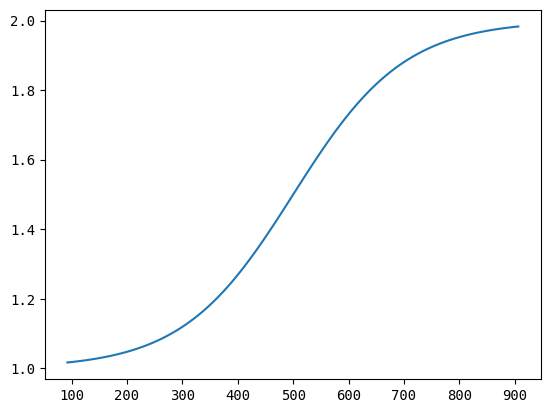

In [245]:
def sigmoid(x):
    return 1 / (1 + np.exp(20*(0.7-x)))

def sigmoid1(x):
    return 1 + 1 / (1 + np.exp(0.01*(500-x)))

x = np.linspace(x_min,x_max,100)
y = sigmoid1(x)


plt.plot(x,y)